# Burkina/Sorghum example

The aim of this notebook is to show how to use the SARRA-Py package to prepare data and perform atteinable yield simulations for sorghum in Burkina Faso. Also, we aim to compare results with MAPSPAM 2017.

# Imports

In [1]:
import numpy as np
import pandas as pd
from pcse.db import NASAPowerWeatherDataProvider
from pcse.util import reference_ET
import datetime
from matplotlib import pyplot as plt
from tqdm import tqdm as tqdm
import io
import xarray as xr
from sarra_py import *
import time

# Extract exemple data

In [2]:
import zipfile

path_to_zip_file = "../data/exemple_data/exemple_data_burkina_2017.zip"
directory_to_extract_to = "../data/exemple_data/"

with zipfile.ZipFile(path_to_zip_file, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)


# Parameters

In [2]:
# date at which simulation is started, and simulation length (duration)
date_start = datetime.date(2017,4,1)
duration = 200

# path of gridded rainfall datasets
TAMSAT_path = "../data/exemple_data/TAMSAT_v3.1_burkina_rfe_filled/"
# CHIRPS_path = "/mnt/d/Mes Donnees/SARRA_data-download/data/3_output/CHIRPS_v2.0_Africa_burkina"

# path for gridded weather datasets
AgERA5_data_path = "../data/exemple_data/AgERA5_burkina/"

# parameter file names
file_paramVariete = "sorgho_variety.yaml"
file_paramITK = "sorghum_burkina_2017.yaml"
file_paramTypeSol = "USA_iowa_V42.yaml"

# data exported from SARRA-H, only used for comparison purposes
file_df_weather = "Meteorologie_US0001.txt"
file_df_rain = "Pluviometrie_US0001.txt"
file_df_ET0 = "ET0_US0001.txt"
file_df_irrig = "Irrigation_AG3US20124.txt"

# Loading base data

This is data that won't change along the simulation.

In [3]:
# define grid dimensions from the rainfall dataset
grid_width, grid_height = get_grid_size(TAMSAT_path, date_start, duration)

# initialize empty xarray dataset
base_data = xr.Dataset()

# load rainfall and weather data
base_data = load_TAMSAT_data(base_data, TAMSAT_path, date_start, duration)
base_data = load_AgERA5_data(base_data, AgERA5_data_path, date_start, duration)

# compute day length raster
base_data = calc_day_length_raster(base_data, date_start, duration)

# load soil parameters
base_data = load_iSDA_soil_data(base_data, grid_width, grid_height)

100%|██████████| 200/200 [00:11<00:00, 16.74it/s]


In [4]:
base_data

<xarray.Dataset>
Dimensions:        (x: 239, y: 186, time: 200)
Coordinates:
  * x              (x) float64 -5.963 -5.925 -5.888 -5.85 ... 2.887 2.925 2.962
  * y              (y) float64 15.97 15.94 15.9 15.86 ... 9.15 9.113 9.075 9.038
    spatial_ref    int64 0
Dimensions without coordinates: time
Data variables: (12/13)
    rain           (time, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    tpMoy          (time, y, x) float32 nan nan nan nan ... 26.34 26.34 26.49
    ET0            (time, y, x) float32 nan nan nan nan ... 3.171 3.171 3.205
    rg             (time, y, x) float32 nan nan nan nan ... 21.69 21.69 21.92
    dureeDuJour    (time, y, x) float32 12.29 12.29 12.29 ... 11.9 11.9 11.9
    soil_type      (y, x) float32 11.0 11.0 9.0 9.0 11.0 ... 9.0 9.0 9.0 9.0 9.0
    ...             ...
    epaisseurSurf  (y, x) float32 200.0 200.0 200.0 200.0 ... 200.0 200.0 200.0
    stockIniProf   (y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    stockIniSurf   (y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    seuilRuiss     (y, x) float32 20.0 20.0 18.0 18.0 ... 18.0 18.0 18.0 18.0
    pourcRuiss     (y, x) float32 0.27 0.27 0.32 0.32 ... 0.32 0.32 0.32 0.32
    ru             (y, x) float32 130.0 130.0 155.0 155.0 ... 155.0 155.0 155.0

# Load simulation data

Loading and preparing simulation-specific data
Loading main input dataarrays

In [4]:
# load variety, cropping system and soil parameters
paramVariete, paramITK, paramTypeSol = load_YAML_parameters(file_paramVariete, file_paramITK, file_paramTypeSol)



In [ ]:
data = base_data.copy()

# initialize null irrigation scheme
data = initialize_default_irrigation(data)

# Run

In [8]:
data = initialize_simulation(data, grid_width, grid_height, duration, paramVariete, paramITK, date_start)
data = calculate_once_daily_thermal_time(data, paramVariete)

In [9]:
start_time = time.time()
data = run_model(paramVariete, paramITK, paramTypeSol, data, duration)
print("--- %s seconds, %s second per iter ---" % ((time.time() - start_time), (time.time() - start_time)/duration))

100%|██████████| 200/200 [01:43<00:00,  1.93it/s]

--- 103.45927715301514 seconds, 0.5172963881492615 second per iter ---


In [10]:
data

<xarray.Dataset>
Dimensions:                             (x: 239, y: 186, time: 200)
Coordinates:
  * x                                   (x) float64 -5.963 -5.925 ... 2.962
  * y                                   (y) float64 15.97 15.94 ... 9.075 9.038
    spatial_ref                         int64 0
Dimensions without coordinates: time
Data variables: (12/114)
    rain                                (time, y, x) float32 0.0 0.0 ... 0.0 0.0
    tpMoy                               (time, y, x) float32 nan nan ... 26.49
    ET0                                 (time, y, x) float32 nan nan ... 3.205
    rg                                  (time, y, x) float32 nan nan ... 21.92
    dureeDuJour                         (time, y, x) float32 12.29 ... 11.9
    soil_type                           (y, x) float32 11.0 11.0 9.0 ... 9.0 9.0
    ...                                  ...
    stockRac                            (time, y, x) float32 0.0 0.0 ... 0.0 0.0
    sumPP                               (time, y, x) float32 0.0 0.0 ... 0.0 0.0
    TigeUp                              (time, y, x) float32 0.0 0.0 ... 0.0 0.0
    UBTCulture                          (time, y, x) float32 0.0 0.0 ... 0.0 0.0
    lai                                 (time, y, x) float32 0.0 0.0 ... 0.0 0.0
    Ncrit                               (time, y, x) float32 nan nan ... 1.534

## Mapping results

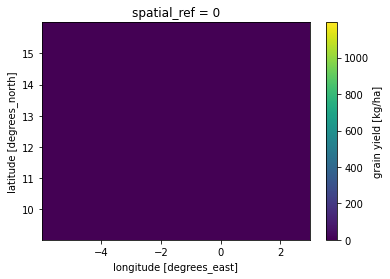

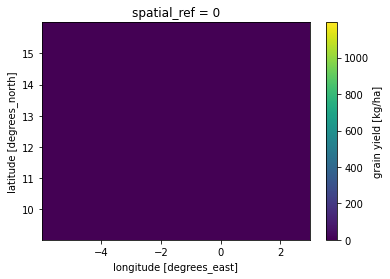

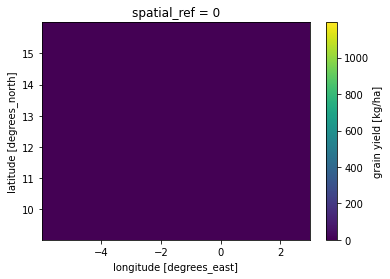

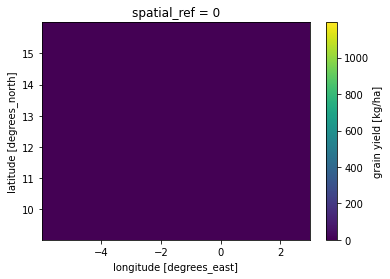

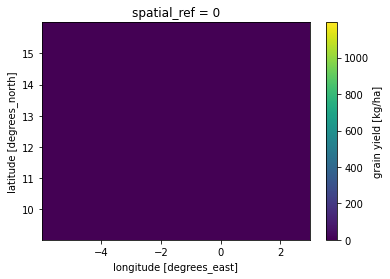

...

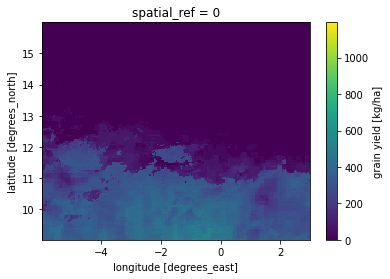

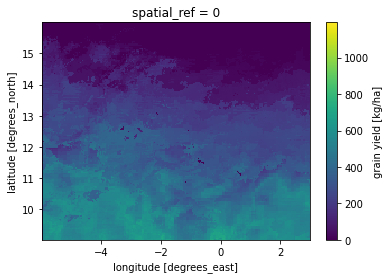

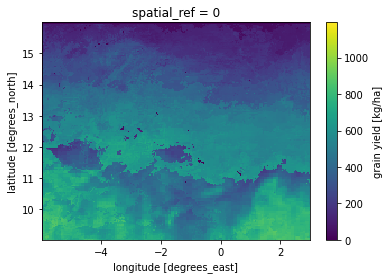

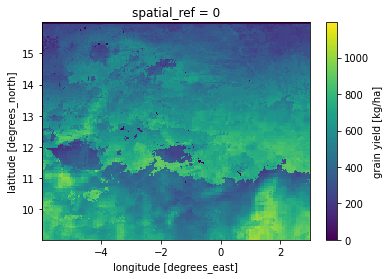

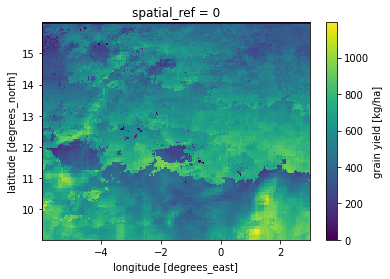

In [11]:
variable = "rdt"
vmax = data[variable].max().values
for i in range(20):
    data[variable][9*i,:,:].plot(vmin=0, vmax=vmax)
    plt.show()

## Loading MAPSPAM 2017 data

In [13]:
# file was gathered from https://dataverse.harvard.edu/file.xhtml?fileId=4271678&version=3.0
# rainfed high inputs production (H)
# load image into a xarray dataarray
mapspam_data = xr.open_dataarray("../data/exemple_data/MapSPAM/spam2017V2r1_SSA_Y_SORG_H.tif")

In [14]:
# reproject the dataarray to the same projection and resolution as the simulation
mapspam_data = mapspam_data.rio.reproject_match(data["rdt"])

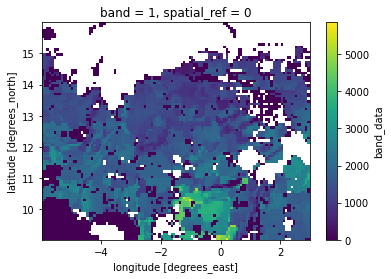

In [15]:
mapspam_data.plot()

In [16]:
# do a scatterplot of the values of the data["rdt"] against mapspam_data using plotly express
# remove the null values from the two datasets
# add a trendline to the scatterplot
import plotly.express as px
df = pd.DataFrame({"rdt":data["rdt"][-1,:,:].values.flatten(), "mapspam":mapspam_data.values.flatten()})
df = df[df["rdt"]>0]
df = df[df["mapspam"]>0]
fig = px.scatter(df, x="rdt", y="mapspam", trendline="ols")
fig.show()



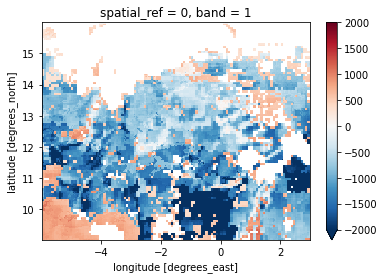

In [16]:
# compute the difference between the two datasets and plot the map
diff = data["rdt"][-1,:,:] - mapspam_data
diff.plot(cmap="RdBu_r", vmin=-2000, vmax=2000)
plt.rcParams['figure.figsize'] = [8,6]
plt.show()


/home/jeremy/.pyenv/versions/3.9.6/envs/venv_SARRA_Py/lib/python3.9/site-packages/xarray/core/computation.py:771: RuntimeWarning:

divide by zero encountered in log



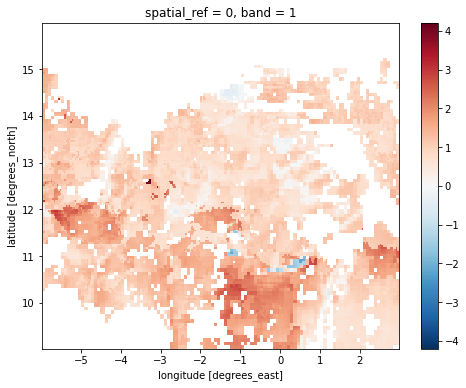

In [17]:
# compute the difference between the two datasets and plot the map
diff = -np.log(data["rdt"][-1,:,:] / mapspam_data)
diff.plot(cmap="RdBu_r")
plt.rcParams['figure.figsize'] = [8,6]
plt.show()

# calibration through optimization

In [16]:
mapspam_data = xr.open_dataarray("../data/exemple_data/MapSPAM/spam2017V2r1_SSA_Y_PMIL_S.tif")

In [40]:
from sklearn.metrics import r2_score

def optimize(SDJBVP, SDJMatu1, KRdtPotA,PPExp,PPSens,TxConversion, FeuilAeroPente, SlaMin,    base_data=base_data, mapspam_data=mapspam_data) :

    data = base_data.copy()
    
    data = initialize_default_irrigation(data)
    data = initialize_simulation(data, grid_width, grid_height, duration, paramVariete, paramITK, date_start)
    data = calculate_once_daily_thermal_time(data, paramVariete)

    paramVariete["SDJBVP"] = SDJBVP
    paramVariete["SDJMatu1"] = SDJMatu1
    paramVariete["KRdtPotA"] = KRdtPotA
    paramVariete["PPExp"] = PPExp
    paramVariete["PPSens"] = PPSens
    paramVariete["TxConversion"] = TxConversion
    paramVariete["FeuilAeroPente"] = FeuilAeroPente
    paramVariete["SlaMin"] = SlaMin

    start_time = time.time()
    data = run_model(paramVariete, paramITK, paramTypeSol, data, duration)
    print("--- %s seconds, %s second per iter ---" % ((time.time() - start_time), (time.time() - start_time)/duration))
    
    mapspam_data = mapspam_data.rio.reproject_match(data["rdt"])

    df = pd.DataFrame({"rdt":data["rdt"][-1,:,:].values.flatten(), "mapspam":mapspam_data.values.flatten()})
    df = df[df["rdt"]>0]
    df = df[df["mapspam"]>0]
    # corr = df[['rdt', 'mapspam']].corr().iloc[0,1]
    # use sklearn.metrics to compute the R2 score
    R2_score = r2_score(df["rdt"], df["mapspam"])

    # compute the difference between the two datasets and plot the map
    diff = data["rdt"][-1,:,:] - mapspam_data
    diff.plot(cmap="RdBu_r", vmin=-2000, vmax=2000)
    plt.rcParams['figure.figsize'] = [8,6]
    plt.show()

    # delete data to free memory
    del data

    return R2_score

In [43]:
from bayes_opt import BayesianOptimization

# Bounded region of parameter space
pbounds = {"SDJBVP":(300.0,770.0),
            "SDJMatu1":(340.0, 380.0),
            "KRdtPotA":(0.2, 0.9),
            "PPExp":(0.0001, 0.25),
            "PPSens":(0.45, 5.0),
            "TxConversion":(2.9, 5.0),
            "FeuilAeroPente":(-1.2E-4, -5.5E-5),
            "SlaMin":(0.0012, 0.002),
            }

optimizer = BayesianOptimization(
    f=optimize,
    pbounds=pbounds,
    random_state=1,
)

|   iter    |  target   | FeuilA... | KRdtPotA  |   PPExp   |  PPSens   |  SDJBVP   | SDJMatu1  |  SlaMin   | TxConv... |
-------------------------------------------------------------------------------------------------------------------------


100%|██████████| 200/200 [03:20<00:00,  1.00s/it]


--- 200.3883159160614 seconds, 1.0019415831565857 second per iter ---


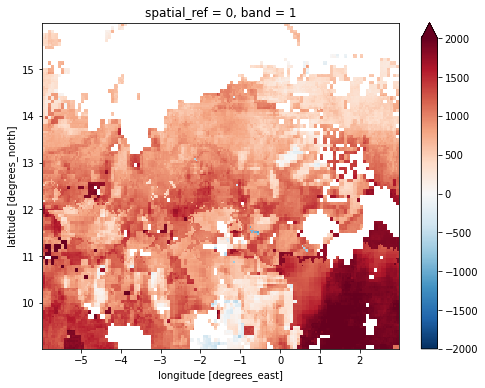

| 177       | -5.462    | -0.000101 | 0.291     | 0.00494   | 3.539     | 399.5     | 350.6     | 0.001593  | 3.012     |


100%|██████████| 200/200 [02:31<00:00,  1.32it/s]


--- 151.64364290237427 seconds, 0.7582182168960572 second per iter ---


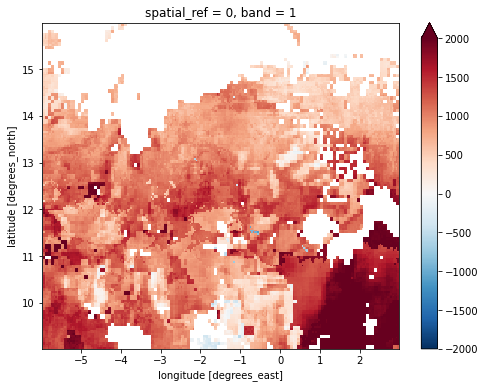

| 178       | -6.803    | -8.268e-0 | 0.3027    | 0.1474    | 3.634     | 348.1     | 356.6     | 0.001756  | 3.77      |


100%|██████████| 200/200 [01:56<00:00,  1.71it/s]


--- 117.00007700920105 seconds, 0.585000387430191 second per iter ---


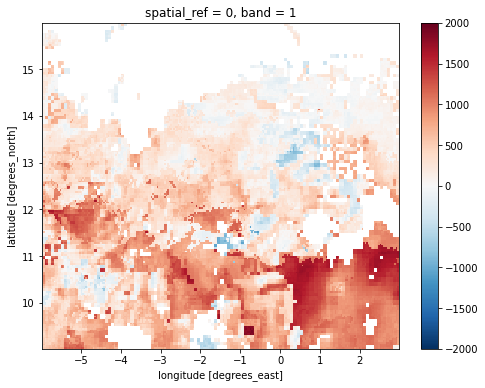

| 179       | -0.5752   | -0.000117 | 0.2179    | 0.1902    | 0.8802    | 754.4     | 340.8     | 0.001465  | 3.103     |


100%|██████████| 200/200 [02:06<00:00,  1.58it/s]


--- 126.5867075920105 seconds, 0.6329335415363312 second per iter ---


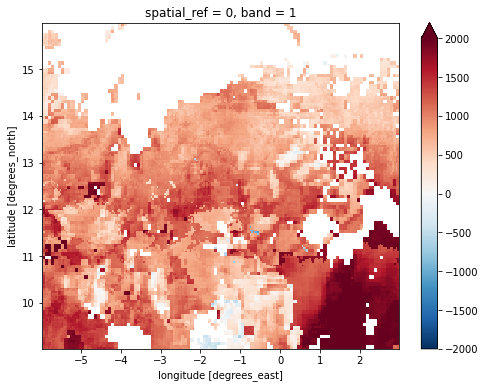

| 180       | -6.271    | -8.434e-0 | 0.3202    | 0.09552   | 0.5892    | 344.0     | 369.6     | 0.001721  | 2.956     |


100%|██████████| 200/200 [02:01<00:00,  1.64it/s]


--- 121.95633006095886 seconds, 0.609781653881073 second per iter ---


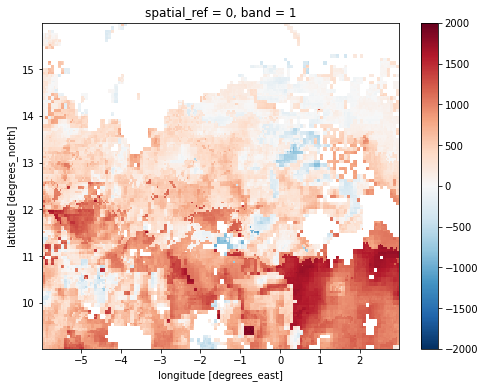

| 181       | -0.7161   | -0.000116 | 0.23      | 0.2411    | 3.7       | 749.0     | 340.0     | 0.001632  | 4.641     |


100%|██████████| 200/200 [02:02<00:00,  1.64it/s]


--- 122.18850207328796 seconds, 0.6109425115585327 second per iter ---


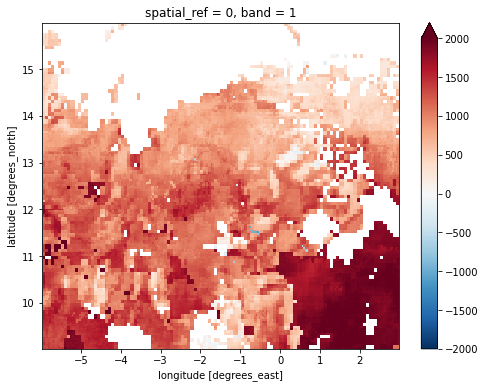

| 182       | -5.819    | -0.000103 | 0.2608    | 0.003181  | 4.819     | 483.1     | 358.7     | 0.001912  | 3.788     |


100%|██████████| 200/200 [02:34<00:00,  1.30it/s]


--- 154.33164310455322 seconds, 0.7716582179069519 second per iter ---


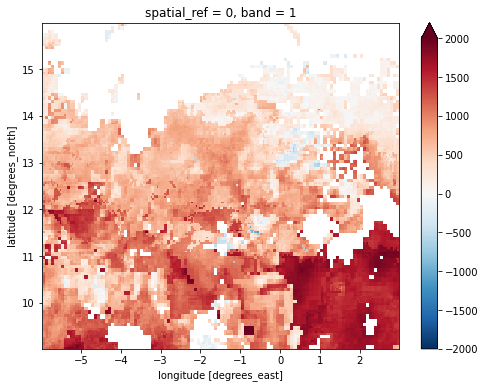

| 183       | -2.174    | -9.48e-05 | 0.3717    | 0.07001   | 1.221     | 699.6     | 373.8     | 0.001787  | 4.647     |


100%|██████████| 200/200 [02:11<00:00,  1.52it/s]


--- 131.27032256126404 seconds, 0.6563516139984131 second per iter ---


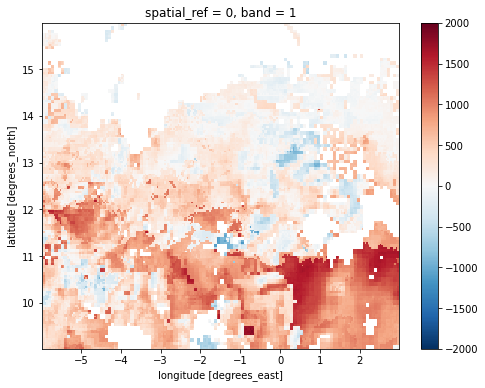

| 184       | -0.3492   | -5.5e-05  | 0.2       | 0.25      | 0.45      | 770.0     | 348.5     | 0.002     | 2.9       |


100%|██████████| 200/200 [02:23<00:00,  1.40it/s]


--- 143.01977682113647 seconds, 0.7150988864898682 second per iter ---


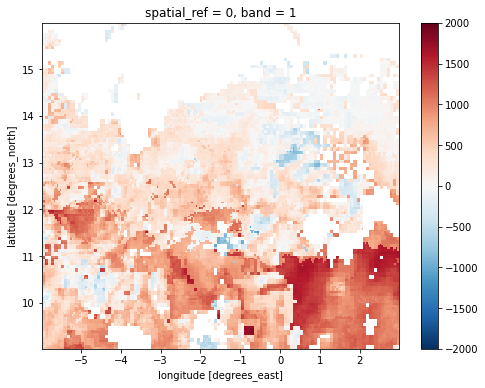

| 185       | -0.5038   | -7.054e-0 | 0.2833    | 0.0447    | 4.146     | 768.8     | 379.8     | 0.001863  | 4.609     |


100%|██████████| 200/200 [03:11<00:00,  1.04it/s]


--- 191.54154992103577 seconds, 0.9577077543735504 second per iter ---


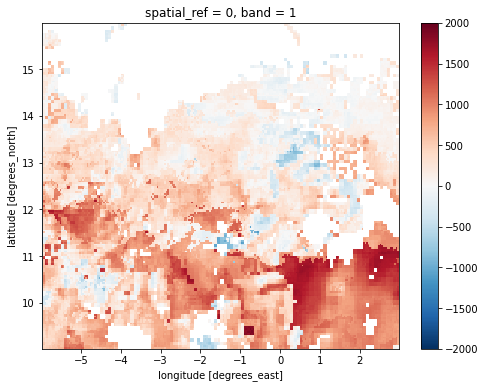

| 186       | -0.5438   | -5.5e-05  | 0.2       | 0.25      | 5.0       | 753.6     | 340.0     | 0.002     | 2.9       |


100%|██████████| 200/200 [03:02<00:00,  1.10it/s]


--- 182.30759119987488 seconds, 0.9115379583835602 second per iter ---


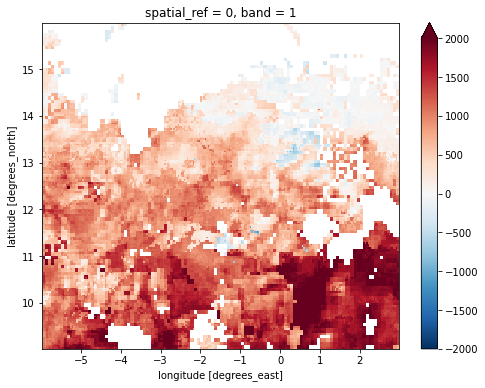

| 187       | -1.23     | -0.000111 | 0.4633    | 0.128     | 0.4792    | 769.4     | 376.4     | 0.001468  | 3.93      |


 84%|████████▎ | 167/200 [03:00<00:35,  1.08s/it]


KeyboardInterrupt: 

In [48]:
optimizer.maximize(
    init_points=2,
    n_iter=150,
)

In [49]:
optimizer.max

{'target': -0.3492133252855849,
 'params': {'FeuilAeroPente': -5.5e-05,
  'KRdtPotA': 0.2,
  'PPExp': 0.25,
  'PPSens': 0.45,
  'SDJBVP': 770.0,
  'SDJMatu1': 348.499176872612,
  'SlaMin': 0.002,
  'TxConversion': 2.9}}